Link del dataset: https://archive.ics.uci.edu/dataset/468/online+shoppers+purchasing+intention+dataset

In [2]:
!pip install ydata-profiling umap-learn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 399.3/399.3 kB 9.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 18.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 48.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.7/679.7 kB 36.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 37.3/37.3 MB 25.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 105.4/105.4 kB 6.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.3/43.3 kB 2.6 MB/s eta 0:00:00
  Attempting uninstall: scipy
    Found existing installation: scipy 1.16.3
    Uninstalling scipy-1.16.3:
      Successfully uninstalled scipy-1.16.3


In [23]:
import pandas as pd
from ydata_profiling import ProfileReport
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import scipy.stats as stats
import statsmodels.api as sm
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE
import umap.umap_ as umap
from scipy.stats import chi2_contingency, norm
import math
from statsmodels.formula.api import ols
from statsmodels.stats.proportion import proportions_ztest

raw_dataset=pd.read_csv("online_shoppers_intention.csv")

# Analisis preliminar

In [ ]:
raw_dataset.describe()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,OperatingSystems,Browser,Region,TrafficType
count,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000
mean,2.315166,80.818611,0.503569,34.472398,31.731468,1194.746220,0.022191,0.043073,5.889258,0.061427,2.124006,2.357097,3.147364,4.069586
std,3.321784,176.779107,1.270156,140.749294,44.475503,1913.669288,0.048488,0.048597,18.568437,0.198917,0.911325,1.717277,2.401591,4.025169
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000
25%,0.000000,0.000000,0.000000,0.000000,7.000000,184.137500,0.000000,0.014286,0.000000,0.000000,2.000000,2.000000,1.000000,2.000000
50%,1.000000,7.500000,0.000000,0.000000,18.000000,598.936905,0.003112,0.025156,0.000000,0.000000,2.000000,2.000000,3.000000,2.000000
75%,4.000000,93.256250,0.000000,0.000000,38.000000,1464.157214,0.016813,0.050000,0.000000,0.000000,3.000000,2.000000,4.000000,4.000000
max,27.000000,3398.750000,24.000000,2549.375000,705.000000,63973.522230,0.200000,0.200000,361.763742,1.000000,8.000000,13.000000,9.000000,20.000000


In [ ]:
raw_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12330 entries, 0 to 12329
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Administrative           12330 non-null  int64  
 1   Administrative_Duration  12330 non-null  float64
 2   Informational            12330 non-null  int64  
 3   Informational_Duration   12330 non-null  float64
 4   ProductRelated           12330 non-null  int64  
 5   ProductRelated_Duration  12330 non-null  float64
 6   BounceRates              12330 non-null  float64
 7   ExitRates                12330 non-null  float64
 8   PageValues               12330 non-null  float64
 9   SpecialDay               12330 non-null  float64
 10  Month                    12330 non-null  object 
 11  OperatingSystems         12330 non-null  int64  
 12  Browser                  12330 non-null  int64  
 13  Region                   12330 non-null  int64  
 14  TrafficType           

In [ ]:
raw_dataset.head()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
0,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,1,1,1,1,Returning_Visitor,False,False
1,0,0.0,0,0.0,2,64.000000,0.00,0.10,0.0,0.0,Feb,2,2,1,2,Returning_Visitor,False,False
2,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,4,1,9,3,Returning_Visitor,False,False
3,0,0.0,0,0.0,2,2.666667,0.05,0.14,0.0,0.0,Feb,3,2,2,4,Returning_Visitor,False,False
4,0,0.0,0,0.0,10,627.500000,0.02,0.05,0.0,0.0,Feb,3,3,1,4,Returning_Visitor,True,False


## Analisis de nulos

In [ ]:
# 1. Calcular el total de filas
total_filas = len(raw_dataset)

# 2. Contar los nulos / nans por columna
conteo_nulos = raw_dataset.isnull().sum()

# 3. Calcular el porcentaje de nulos por columna
porcentaje_nulos = (conteo_nulos / total_filas) * 100

# 4. Crear un DataFrame para mostrar los resultados de forma ordenada
analisis_nulos = pd.DataFrame({
    'Conteo de Nulos': conteo_nulos,
    'Porcentaje (%)': porcentaje_nulos,
})

# 5. Ordenar la tabla por el porcentaje de nulos de mayor a menor
analisis_nulos = analisis_nulos.sort_values(by='Porcentaje (%)', ascending=False)

# 6. Mostrar el resultado
print(f"Análisis de valores nulos sobre un total de {total_filas} filas:\n")
print(analisis_nulos)

Análisis de valores nulos sobre un total de 12330 filas:

                         Conteo de Nulos  Porcentaje (%)
Administrative                         0             0.0
Administrative_Duration                0             0.0
Informational                          0             0.0
Informational_Duration                 0             0.0
ProductRelated                         0             0.0
ProductRelated_Duration                0             0.0
BounceRates                            0             0.0
ExitRates                              0             0.0
PageValues                             0             0.0
SpecialDay                             0             0.0
Month                                  0             0.0
OperatingSystems                       0             0.0
Browser                                0             0.0
Region                                 0             0.0
TrafficType                            0             0.0
VisitorType                   

## Report profile

In [ ]:
# 1. Crear el objeto del reporte
profile = ProfileReport(raw_dataset, title="Reporte de Perfil del Dataset")

# 2. Mostrar el reporte
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 18/18 [00:00<00:00, 39.52it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Limpieza

In [7]:
clean_dataset=raw_dataset.copy()

In [8]:
#Borramos duplicados
clean_dataset = clean_dataset.drop_duplicates()

In [9]:
# Agrupamos categorías con baja frecuencia (<1% de la muestra) en una nueva categoría "otros"
total_samples = len(clean_dataset)
threshold = total_samples * 0.01

# --- OperatingSystems ---
value_counts = clean_dataset['OperatingSystems'].value_counts()
categories_to_group = value_counts[value_counts < threshold].index
max_value = clean_dataset['OperatingSystems'].max()
# Nueva categoría: otros sistemas = max_value + 1
clean_dataset['OperatingSystems'] = clean_dataset['OperatingSystems'].apply(
    lambda x: max_value + 1 if x in categories_to_group else x
)

# --- Browser ---
value_counts = clean_dataset['Browser'].value_counts()
categories_to_group = value_counts[value_counts < threshold].index
max_value = clean_dataset['Browser'].max()
# Nueva categoría: otro navegador = max_value + 1
clean_dataset['Browser'] = clean_dataset['Browser'].apply(
    lambda x: max_value + 1 if x in categories_to_group else x
)

# --- TrafficType ---
value_counts = clean_dataset['TrafficType'].value_counts()
categories_to_group = value_counts[value_counts < threshold].index
max_value = clean_dataset['TrafficType'].max()
# Nueva categoría: otro tráfico = max_value + 1
clean_dataset['TrafficType'] = clean_dataset['TrafficType'].apply(
    lambda x: max_value + 1 if x in categories_to_group else x
)


Chequeamos las nuevas categorias

In [10]:
clean_dataset['OperatingSystems'].value_counts()

,count
OperatingSystems,
2,6541
1,2549
3,2530
4,478
9,107


In [11]:
clean_dataset['Browser'].value_counts()

,count
Browser,
2,7883
1,2427
4,731
5,465
14,227
6,174
10,163
8,135


In [12]:
clean_dataset['TrafficType'].value_counts()

,count
TrafficType,
2,3911
1,2388
3,2013
4,1066
13,728
10,450
6,443
8,343
5,260


In [13]:
#Convertimos las columnas con string a minisculas
clean_dataset['Month'] = clean_dataset['Month'].str.lower()
clean_dataset['VisitorType'] = clean_dataset['VisitorType'].str.lower()

In [14]:
#Chequeamos que este todo minuscula
clean_dataset['Month'].value_counts()

,count
Month,
may,3329
nov,2982
mar,1860
dec,1706
oct,549
sep,448
aug,433
jul,432
june,285


In [15]:
# Mapeo de meses a números, aplicamos label coding, util para variables ordinales como el mes
month_map = {
    'feb': 2, 'mar': 3, 'may': 5, 'june': 6, 'jul': 7,
    'aug': 8, 'sep': 9, 'oct': 10, 'nov': 11, 'dec': 12
}
clean_dataset['Month'] = clean_dataset['Month'].map(month_map)
clean_dataset['Month'] = clean_dataset['Month'].astype('int8')
clean_dataset['Month'].value_counts()

,count
Month,
5,3329
11,2982
3,1860
12,1706
10,549
9,448
8,433
7,432
6,285


In [16]:
#Chequeamos que este todo minuscula
clean_dataset['VisitorType'].value_counts()

,count
VisitorType,
returning_visitor,10431
new_visitor,1693
other,81


In [17]:
#Convertir booleanos a enteros
clean_dataset[['Weekend', 'Revenue']] = clean_dataset[['Weekend', 'Revenue']].astype('int8')

In [18]:
clean_dataset.info()

<class 'pandas.core.frame.DataFrame'>
Index: 12205 entries, 0 to 12329
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Administrative           12205 non-null  int64  
 1   Administrative_Duration  12205 non-null  float64
 2   Informational            12205 non-null  int64  
 3   Informational_Duration   12205 non-null  float64
 4   ProductRelated           12205 non-null  int64  
 5   ProductRelated_Duration  12205 non-null  float64
 6   BounceRates              12205 non-null  float64
 7   ExitRates                12205 non-null  float64
 8   PageValues               12205 non-null  float64
 9   SpecialDay               12205 non-null  float64
 10  Month                    12205 non-null  int8   
 11  OperatingSystems         12205 non-null  int64  
 12  Browser                  12205 non-null  int64  
 13  Region                   12205 non-null  int64  
 14  TrafficType              12

## Analisis outliers

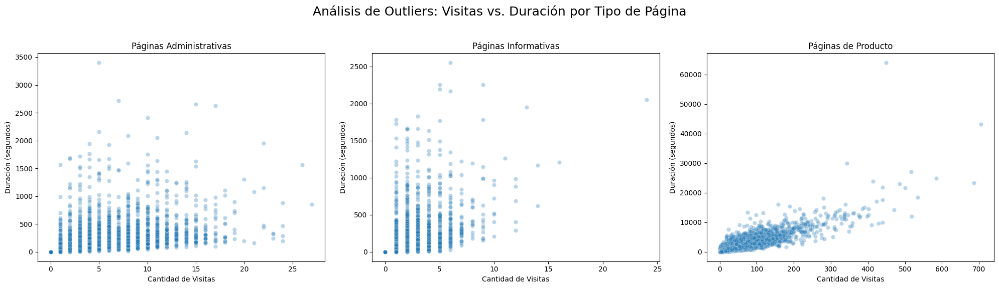

In [19]:
# Crear la Cuadrícula de Gráficos (1 fila, 3 columnas)
fig, axes = plt.subplots(1, 3, figsize=(20, 6))
fig.suptitle('Análisis de Outliers: Visitas vs. Duración por Tipo de Página', fontsize=18)

# Gráfico de Dispersión: Administrativas
sns.scatterplot(ax=axes[0],
                data=clean_dataset,
                x='Administrative',
                y='Administrative_Duration',
                alpha=0.3, # Transparencia para ver la densidad
                )
axes[0].set_title('Páginas Administrativas')
axes[0].set_xlabel('Cantidad de Visitas')
axes[0].set_ylabel('Duración (segundos)')

#Gráfico de Dispersión: Informativas
sns.scatterplot(ax=axes[1],
                data=clean_dataset,
                x='Informational',
                y='Informational_Duration',
                alpha=0.3)
axes[1].set_title('Páginas Informativas')
axes[1].set_xlabel('Cantidad de Visitas')
axes[1].set_ylabel('Duración (segundos)')

# Gráfico de Dispersión: Relacionadas con Producto
sns.scatterplot(ax=axes[2],
                data=clean_dataset,
                x='ProductRelated',
                y='ProductRelated_Duration',
                alpha=0.3,
                )
axes[2].set_title('Páginas de Producto')
axes[2].set_xlabel('Cantidad de Visitas')
axes[2].set_ylabel('Duración (segundos)')

plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Ajustar para el supertítulo
plt.show()

# Hipotesis 1: Los usuarios que realizan compras demuestran un mayor engagement, medido como tasa de tiempo por visita(Tiempo_Total) más alto, en comparación con los que no compran



In [ ]:
h1 = clean_dataset.copy()

#Calcular la Tasa (Duración / Visita) para cada categoría
#Usamos np.where para evitar la división por cero.

h1["Admin_Tasa"] = np.where(
    h1["Administrative"] > 0,  # Si las visitas son > 0
    h1["Administrative_Duration"] / h1["Administrative"], # Divide
    0  # De lo contrario, 0
)

h1["Info_Tasa"] = np.where(
    h1["Informational"] > 0,
    h1["Informational_Duration"] / h1["Informational"],
    0
)

h1["Product_Tasa"] = np.where(
    h1["ProductRelated"] > 0,
    h1["ProductRelated_Duration"] / h1["ProductRelated"],
    0
)

#Crear "Tiempo_Total" como la suma de las tasas
#Esto es ahora simple y seguro, ya que no hay infinitos.
h1["Tiempo_Total"] = h1["Admin_Tasa"] + h1["Info_Tasa"] + h1["Product_Tasa"]

Chequeamos la columna nueva

In [ ]:
h1['Tiempo_Total'].describe()

,Tiempo_Total
count,12205.000000
mean,73.381667
std,99.346059
min,0.000000
25%,24.862500
50%,48.135300
75%,88.246429
max,2822.000000


## Visualizacion

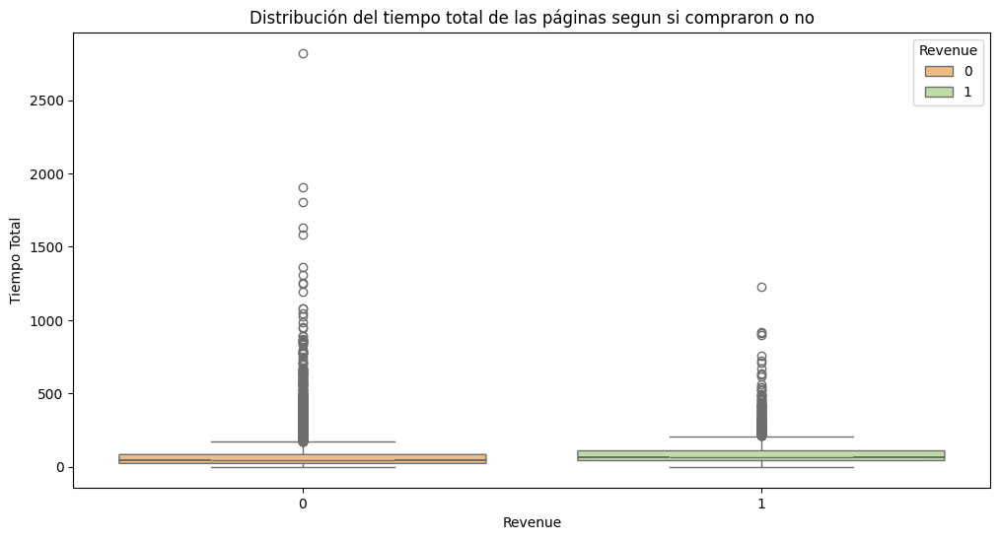

In [ ]:
# Armar bloxplot del tiempo total
plt.figure(figsize=(12,6))
sns.boxplot(data=h1, x="Revenue", y="Tiempo_Total", palette="Spectral",hue="Revenue", legend=True,notch=True)
plt.title("Distribución del tiempo total de las páginas segun si compraron o no")
plt.xlabel("Revenue")
plt.ylabel("Tiempo Total")
plt.show()

Hagamos mas zoom sobre los boxplots para ver bien la distribucion principal.

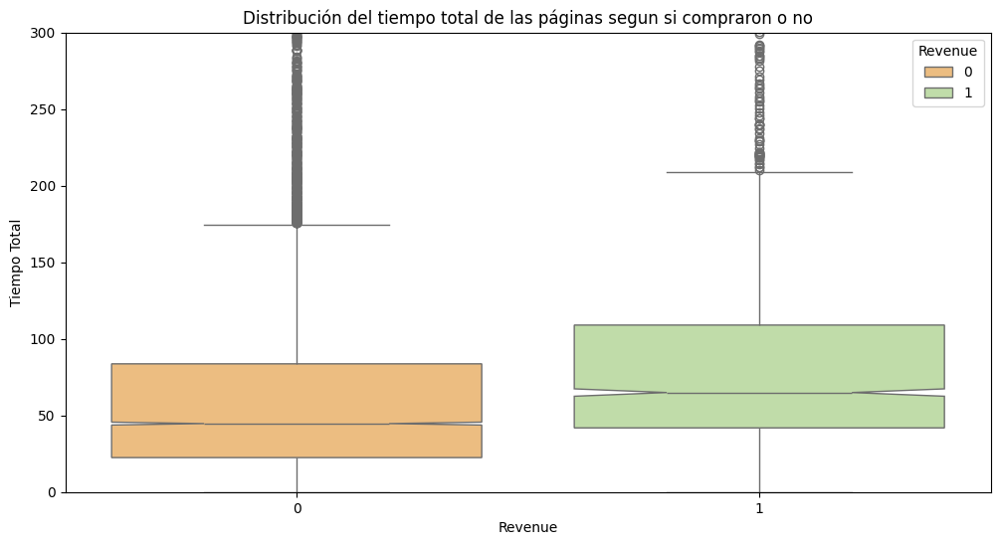

In [ ]:
plt.figure(figsize=(12,6))
sns.boxplot(data=h1, x="Revenue", y="Tiempo_Total", palette="Spectral",hue="Revenue", legend=True,notch=True)
plt.title("Distribución del tiempo total de las páginas segun si compraron o no")
plt.ylim(0, 300)
plt.xlabel("Revenue")
plt.ylabel("Tiempo Total")
plt.show()

## Test de normalidad

In [ ]:
# Verificar normalidad
# 1. Filtra el DataFrame
revenue_df = h1[h1['Revenue'] == 1]

# 2. Selecciona la COLUMNA NUMÉRICA que quieres probar
tiempo_compras_exitosas = revenue_df['Tiempo_Total']

# 3. Aplica el test de Shapiro a esa columna específica
stat, p = stats.shapiro(tiempo_compras_exitosas)

print(f"Test de Shapiro-Wilk para Tiempo_Total y revenue=true: Estadístico={stat:.3f}, p-valor={p:.3f}")


revenue_df = h1[h1['Revenue'] == 0]
tiempo_compras_fallidas = revenue_df['Tiempo_Total']
stat, p = stats.shapiro(tiempo_compras_fallidas)

print(f"Test de Shapiro-Wilk para Tiempo_Total y revenue=false: Estadístico={stat:.3f}, p-valor={p:.3f}")

Test de Shapiro-Wilk para Tiempo_Total y revenue=true: Estadístico=0.638, p-valor=0.000
Test de Shapiro-Wilk para Tiempo_Total y revenue=false: Estadístico=0.520, p-valor=0.000


/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 10297.
  res = hypotest_fun_out(*samples, **kwds)


## Test de homocedasticidad

In [ ]:
# Verificar homocedasticidad
stat, p = stats.levene(tiempo_compras_exitosas, tiempo_compras_fallidas)
print(f"Test de Levene: Estadístico={stat:.3f}, p-valor={p:.3f}")

Test de Levene: Estadístico=4.019, p-valor=0.045


## Test de hipotesis

In [ ]:
# Test de Kruskal-Wallis para comparar Tiempo_total entre las compras con revenue=1 y revenue=0
stat, p = stats.kruskal(tiempo_compras_exitosas, tiempo_compras_fallidas)
print(f"Test de Kruskal-Wallis: Estadístico={stat:.3f}, p-valor={p:.3f}")

# Interpretación de los resultados
alpha = 0.05  # Nivel de significancia
if p > alpha:
    print("No hay suficiente evidencia para rechazar la hipótesis nula.")
else:
    print("Se rechaza la hipótesis nula.")

Test de Kruskal-Wallis: Estadístico=379.360, p-valor=0.000
Se rechaza la hipótesis nula.


In [ ]:
# Aplicar test U de Mann Whitnney
stat, p = stats.mannwhitneyu(tiempo_compras_exitosas, tiempo_compras_fallidas)
print(f"Test U de Mann-Whitney: Estadístico={stat:.3f}, p-valor={p:.3f}")

Test U de Mann-Whitney: Estadístico=12576558.500, p-valor=0.000


# Hipotesis 2: Existen factores, como BounceRates, ExitRates, PageValues y SpecialDay, que influyen significativamente en la tasa de tiempo por visita de los usuarios en el sitio


In [ ]:
h2=clean_dataset.copy()
h2['Tiempo_Total']=h1['Tiempo_Total']

## Modelo de regresion lineal

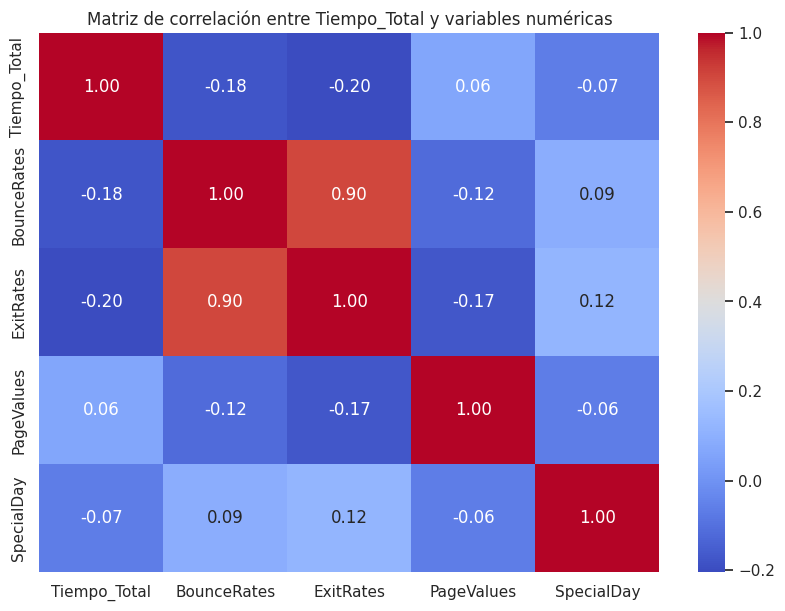

In [ ]:
num_vars = [ "BounceRates", "ExitRates", "PageValues", "SpecialDay"]

corr = h2[["Tiempo_Total"] + num_vars].corr()

plt.figure(figsize=(10,7))
sns.heatmap(corr, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Matriz de correlación entre Tiempo_Total y variables numéricas")
plt.show()

A simple vista, se evidencia que no existen correlaciones fuertes entre el Tiempo_Total y las demás variables, lo cual anticipa que un modelo lineal podría no tener gran capacidad explicativa. Sin embargo, este análisis sigue siendo valioso para comprender las interacciones entre variables.

Se destacan algunos puntos interesantes:

* BounceRates y ExitRates presentan una correlación extremadamente alta (≈ 0.90), lo que indica que ambas métricas reflejan comportamientos muy similares de abandono del sitio. Por lo tanto, incluir ambas en un mismo modelo podría generar problemas de multicolinealidad y afectar la estabilidad de los coeficientes.

* PageValues y SpecialDay muestran correlaciones débiles con el tiempo total, pero podrían tener un efecto combinado o no lineal que valga la pena explorar.

* Las correlaciones negativas entre Tiempo_Total y las tasas de rebote/salida sugieren que a mayor interacción del usuario (más tiempo), menores son las probabilidades de abandono, lo cual es coherente con el comportamiento esperado.

En síntesis, aunque las correlaciones iniciales no son alentadoras para esperar un modelo lineal altamente predictivo, se procede con la regresión para evaluar si existen factores que impacten significativamente en el tiempo total de permanencia de los usuarios.

Lo óptimo sería explorar modelos no lineales para evaluar relaciones más complejas entre las variables. Sin embargo, estos enfoques exceden los contenidos vistos en la práctica, por lo que se limita el análisis a un modelo lineal múltiple como aproximación inicial

In [ ]:
# Variable dependiente
y = h2["Tiempo_Total"]

# Variables independientes
X = h2[["BounceRates", "PageValues", "SpecialDay"]]

# ---Agregar constante---
X = sm.add_constant(X)

# --- Ajustar el modelo ---
modelo = sm.OLS(y, X).fit()

# ---Mostrar resumen ---
print(modelo.summary())


                            OLS Regression Results                            
Dep. Variable:           Tiempo_Total   R-squared:                       0.035
Model:                            OLS   Adj. R-squared:                  0.035
Method:                 Least Squares   F-statistic:                     147.2
Date:                Thu, 13 Nov 2025   Prob (F-statistic):           1.10e-93
Time:                        22:49:48   Log-Likelihood:                -73227.
No. Observations:               12205   AIC:                         1.465e+05
Df Residuals:                   12201   BIC:                         1.465e+05
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const          81.1456      1.056     76.866      

El valor de R^2= 0.035 indica que el modelo explica solo el 3,5% de la variabilidad total del tiempo en página, lo que refleja un bajo poder explicativo.
Esto sugiere que el comportamiento del tiempo total no puede modelarse adecuadamente con una relación lineal simple entre estas variables: probablemente intervengan factores no lineales o interacciones complejas (como el tipo de visitante, la intención de compra o el tipo de página visitada).

A pesar del bajo R^2, el estadístico F = 147.2 con un p-valor < 0.001 indica que el modelo en su conjunto es estadísticamente significativo.
Es decir, aunque la capacidad predictiva global sea limitada, al menos una de las variables independientes tiene un efecto lineal significativo sobre Tiempo_Total.

Los resultados del test Omnibus y Jarque-Bera (p ≈ 0.000) muestran que los residuos no siguen una distribución normal, confirmando que los supuestos clásicos de la regresión lineal no se cumplen completamente.
Esto implica que, si bien el modelo puede describir tendencias generales, no es óptimo para realizar inferencias precisas sobre la población ni para usarlo como modelo predictivo robusto.

## t-SNE y UMAP

Dado que el modelo lineal no mostró una capacidad explicativa satisfactoria sobre el Tiempo_Total, se decidió aplicar técnicas de reducción de dimensionalidad no lineales (t-SNE y UMAP) con el fin de explorar patrones ocultos en las variables del comportamiento del usuario.

En este caso, se utilizan únicamente variables numéricas continuas:

* BounceRates: porcentaje de usuarios que abandonan la página sin interactuar.

* ExitRates: frecuencia con la que una página es la última visitada antes de salir.

* PageValues: valor promedio de una página previo a una compra.

* SpecialDay: cercanía temporal a fechas especiales (Día de la Madre, San Valentín, etc.).

Se excluyen las variables categóricas (Browser, OperatingSystem, Region, TrafficType) ya que t-SNE y UMAP calculan distancias continuas y las categorías codificadas numéricamente podrían distorsionar los resultados.

Ambos métodos permiten reducir el espacio de características a dos dimensiones y visualizar cómo se agrupan las observaciones según las variables seleccionadas.

In [ ]:
# Seleccionamos SOLO las variables numéricas continuas
features = num_vars
X = h2[features]

# ESCALADO (Crucial para t-SNE y UMAP)
# Deben estar en la misma escala para que las distancias sean comparables.
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# --- Aplicar t-SNE ---
# n_components=2 para graficar en 2D
# random_state para reproducibilidad
tsne = TSNE(n_components=2, random_state=42)
X_tsne = tsne.fit_transform(X_scaled)

# --- Aplicar UMAP ---
umap_reducer = umap.UMAP(n_components=2)
X_umap = umap_reducer.fit_transform(X_scaled)

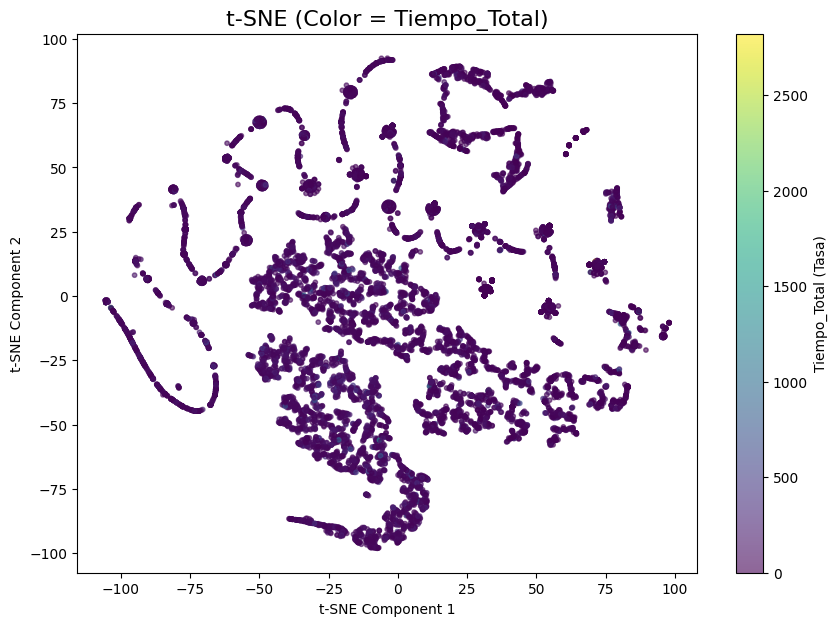

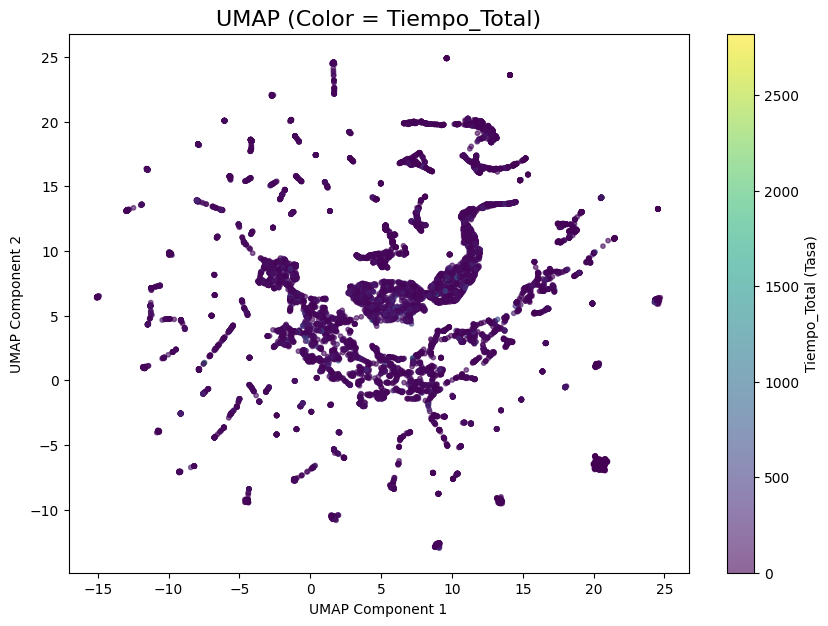

In [ ]:
color_variable = h2['Tiempo_Total']

# --- Gráfico t-SNE (Coloreado por Tiempo_Total) ---
# Usamos 'c' para variables continuas y 'cmap' para un colormap
plt.figure(figsize=(10, 7))
sc1 = plt.scatter(
    x=X_tsne[:, 0], y=X_tsne[:, 1],
    c=color_variable,
    cmap='viridis',
    alpha=0.6,
    s=10
)
plt.title('t-SNE (Color = Tiempo_Total)', fontsize=16)
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.colorbar(sc1, label='Tiempo_Total (Tasa)')
plt.show()

# --- Gráfico UMAP (Coloreado por Tiempo_Total) ---
plt.figure(figsize=(10, 7))
sc2 = plt.scatter(
    x=X_umap[:, 0], y=X_umap[:, 1],
    c=color_variable,
    cmap='viridis',
    alpha=0.6,
    s=10
)
plt.title('UMAP (Color = Tiempo_Total)', fontsize=16)
plt.xlabel('UMAP Component 1')
plt.ylabel('UMAP Component 2')
plt.colorbar(sc2, label='Tiempo_Total (Tasa)')
plt.show()

No se observan agrupamientos definidos ni gradientes claros en función del Tiempo_Total, lo que sugiere que las variables BounceRates, ExitRates, PageValues y SpecialDay no determinan de manera directa el tiempo promedio por visita.

En síntesis, la hipótesis no se sostiene con los datos analizados. Las variables de comportamiento consideradas (BounceRates, ExitRates, PageValues, SpecialDay) no explican de manera significativa el tiempo promedio de navegación del usuario. Esto sugiere que el comportamiento temporal podría depender de interacciones más complejas entre variables, o de factores no observados en el dataset actual.

# Hipotesis 3: Aunque los Visitantes Recurrentes generan mayor volumen de compras, los Visitantes Nuevos demuestran una tasa de conversión (calidad) estadísticamente superior


In [ ]:
h3=clean_dataset.copy()

# Quitar visitantes other, al ser pocas muestras, no son relevantes para el analisis
h3 = h3[h3["VisitorType"] != "other"]

In [ ]:
h3['VisitorType'].value_counts()

,count
VisitorType,
returning_visitor,10431
new_visitor,1693


## Visualizacion

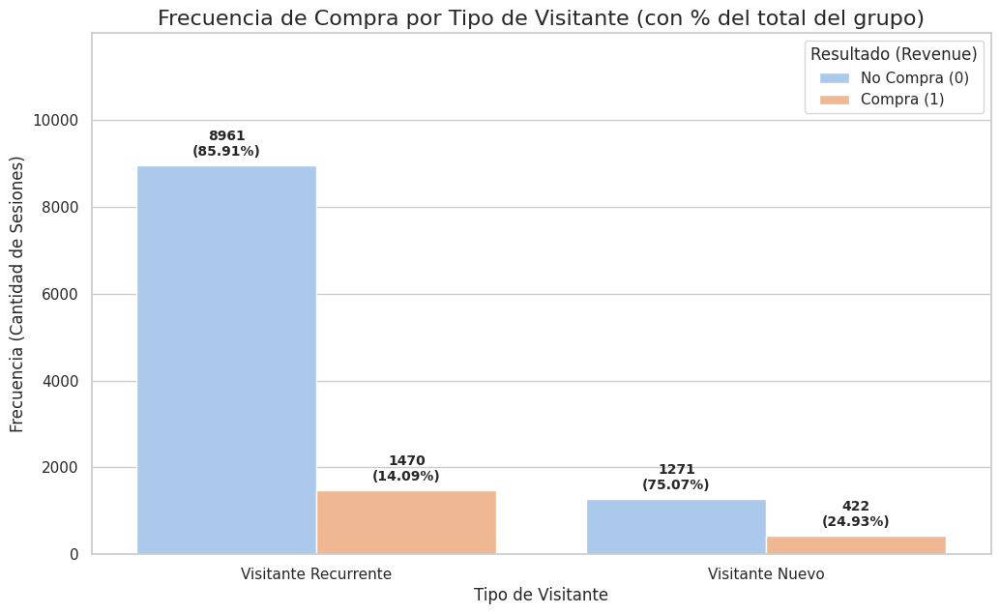

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

plt.figure(figsize=(12,7))
sns.set_style("whitegrid")

ax = sns.countplot(data=h3, x="VisitorType", hue="Revenue", palette="pastel")

# Totales por grupo
group_totals = h3.groupby("VisitorType")["Revenue"].count().to_dict()

# Recorremos las barras y agregamos etiquetas correctas
# (Este bucle se ejecuta ANTES de que cambiemos las etiquetas,
# por lo que 'get_xticklabels()' obtiene los nombres originales
# 'Returning_Visitor' y 'New_Visitor', lo cual es correcto para el 'group_totals')
for c in ax.containers:
  for p in c:
    height = p.get_height()
    category = p.get_x() + p.get_width()/2
    label = ax.get_xticklabels()[round(category)].get_text()
    total = group_totals[label]
    percentage = (height / total) * 100
    label_text = f"{height:.0f}\n({percentage:.2f}%)"
    ax.annotate(label_text,
     (p.get_x() + p.get_width()/2, height),
                ha="center", va="bottom",
                xytext=(0,5),
                textcoords="offset points",
                fontsize=10,
                weight="bold")

# Ajustes
ax.set_ylim(0, h3["VisitorType"].value_counts().max() * 1.15)
ax.legend(title="Resultado (Revenue)", labels=["No Compra (0)", "Compra (1)"])
plt.title("Frecuencia de Compra por Tipo de Visitante (con % del total del grupo)", fontsize=16)
plt.xlabel("Tipo de Visitante", fontsize=12)
ax.set_xticks([0, 1])
ax.set_xticklabels(["Visitante Recurrente", "Visitante Nuevo"])
plt.ylabel("Frecuencia (Cantidad de Sesiones)", fontsize=12)
plt.show()

## Test de hipotesis

Se utiliza un test de Chi-cuadrado de independencia porque tanto `VisitorType` como `Revenue` son variables categóricas. El objetivo es evaluar si existe asociación entre ellas (si la cantidad de compras depende del tipo de visitante). Otros tests, como la t de Student o ANOVA, requieren variables numéricas y no serían apropiados en este caso ya que comparan medias o otras medidas.


H0: el tipo de visitante no influye en la cantidad de compras.

H1: el tipo de visitante sí influye, o sea, las proporciones de compra difieren entre visitantes nuevos y recurrentes.

In [ ]:
tabla = pd.crosstab(h3["VisitorType"], h3["Revenue"])

chi2, p, dof, expected = chi2_contingency(tabla)
print(f"Chi-cuadrado = {chi2:.4f}")
print(f"p-valor = {p:.4f}")
print(f"Grados de libertad = {dof}")

Chi-cuadrado = 128.9831
p-valor = 0.0000
Grados de libertad = 1


El Test de Chi-Cuadrado de Independencia (p=0.0000) confirma que existe una relación estadísticamente significativa entre el tipo de visitante y la probabilidad de compra (Revenue). O sea, las diferencias que ves entre tipos de visitantes no son al azar, hay un patrón real detrás.

Al analizar el gráfico de barras, podemos definir la naturaleza de esta relación, la cual expone una dualidad clave (Volumen vs. Calidad):

En Volumen Absoluto: Los Visitantes Recurrentes generan la gran mayoría de las transacciones (1,470 compras) en comparación con los Visitantes Nuevos (422 compras).

En Tasa de Conversión (Calidad): Los Visitantes Nuevos son significativamente más valiosos, demostrando una tasa de conversión (24.93%) que es casi el doble que la de los Visitantes Recurrentes (14.09%).

# Hipotesis 4: La intención de compra es un evento raro: La mayoría de las sesiones (70%) son puramente exploratorias, lo cual se valida con una proporción de usuarios con un PageValue $\le$ 1

En este dataset, la mayoría de los valores de PageValues suelen ser muy bajos (mediana cercana a 0, y cola derecha con pocos valores altos).
Si el porcentaje ≤ 1 supera el 70%, la hipótesis se confirma: la navegación es mayormente exploratoria, sin intención de compra.

In [32]:
# Tenemos que armar los grupos primero
h4=clean_dataset.copy()
h4['explorador'] = np.where(h4['PageValues'] <= 1, 1, 0)

## Visualizacion

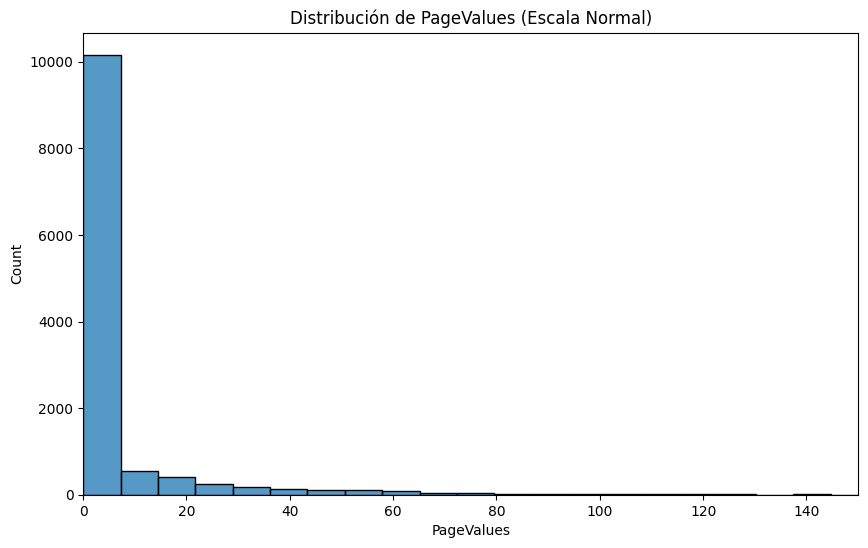

In [29]:
plt.figure(figsize=(10, 6))
sns.histplot(data=h4, x='PageValues', bins=50)
plt.title('Distribución de PageValues (Escala Normal)')
plt.xlim(0, 150)
plt.show()

## Test de hipotesis

El Test Z se basa en el Teorema del Límite Central (TLC).

Este teorema dice que si tu tamaño de muestra (N) es lo suficientemente grande (generalmente N > 30), la distribución de muestreo de la media (o proporción) será normal, sin importar cómo se distribuyan los datos originales.

In [33]:
# 1. Definir los grupos
exploradores = h4[h4['explorador'] == 1]
total_sesiones = len(h4)

# 2. Obtener los conteos
conteo_exitos = len(exploradores)
n_observaciones = total_sesiones
p_hipotetica = 0.70

# 3. Ejecutar el Test Z de 1 Proporción
# H0: p >= 0.70
# H1: p < 0.70
z_stat, p_valor = proportions_ztest(count=conteo_exitos,
                                    nobs=n_observaciones,
                                    value=p_hipotetica,
                                    alternative='smaller')

# 4. Mostrar resultados
tasa_observada = conteo_exitos / n_observaciones

print(f"--- Test Z de 1 Proporción (Validación H4) ---")
print(f"Total de Sesiones: {n_observaciones}")
print(f"Sesiones 'Exploradoras' (PageValue <= 1): {conteo_exitos}")
print(f"Tasa Observada: {tasa_observada:.2%}")
print(f"Tasa Hipotética (H0): {p_hipotetica:.2%}")
print("-" * 30)
print(f"Estadístico Z: {z_stat:.4f}")
print(f"P-Valor: {p_valor:.4f}")
print("-" * 30)

if p_valor < 0.05:
    print("Conclusión: Rechazamos H0 (p < 0.05).")
    print(f"La proporción real de exploradores ({tasa_observada:.2%}) es ESTADÍSTICAMENTE DIFERENTE de 70%.")
else:
    print("Conclusión: No podemos rechazar H0 (p >= 0.05).")
    print(f"La proporción observada ({tasa_observada:.2%}) es estadísticamente COMPATIBLE con 70%.")

--- Test Z de 1 Proporción (Validación H4) ---
Total de Sesiones: 12205
Sesiones 'Exploradoras' (PageValue <= 1): 9540
Tasa Observada: 78.16%
Tasa Hipotética (H0): 70.00%
------------------------------
Estadístico Z: 21.8335
P-Valor: 1.0000
------------------------------
Conclusión: No podemos rechazar H0 (p >= 0.05).
La proporción observada (78.16%) es estadísticamente COMPATIBLE con 70%.


# Hipotesis 5: La tasa de rebote varia significativamente segun la region, mes y si la visita ocurrio en fin de semana o no



In [35]:
h5 = clean_dataset.copy()

## Visualizacion

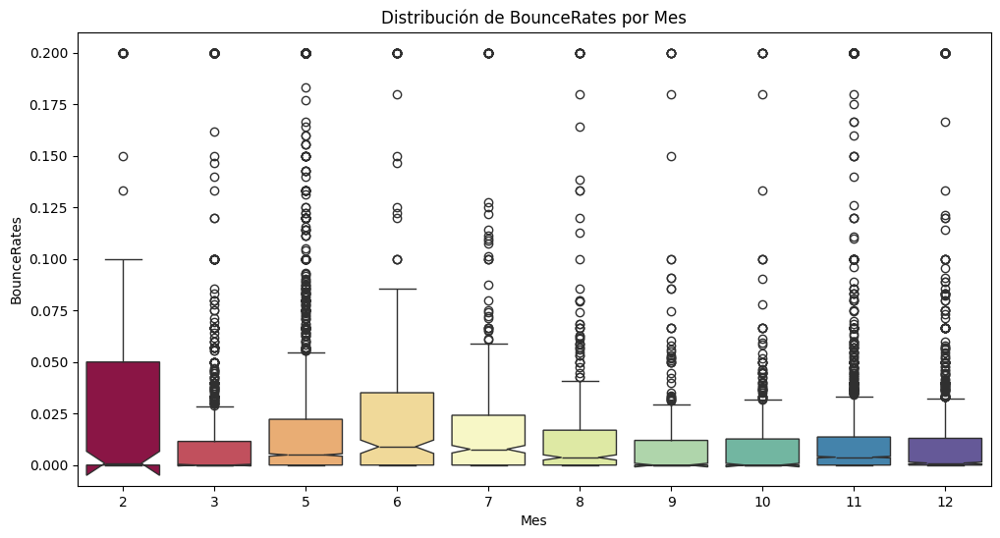

In [43]:
#Boxplot por mes
plt.figure(figsize=(12,6))
sns.boxplot(data=h5, x="Month", y="BounceRates", palette="Spectral",hue="Month", legend=False,notch=True)
plt.title("Distribución de BounceRates por Mes")
plt.xlabel("Mes")
plt.ylabel("BounceRates")
plt.show()

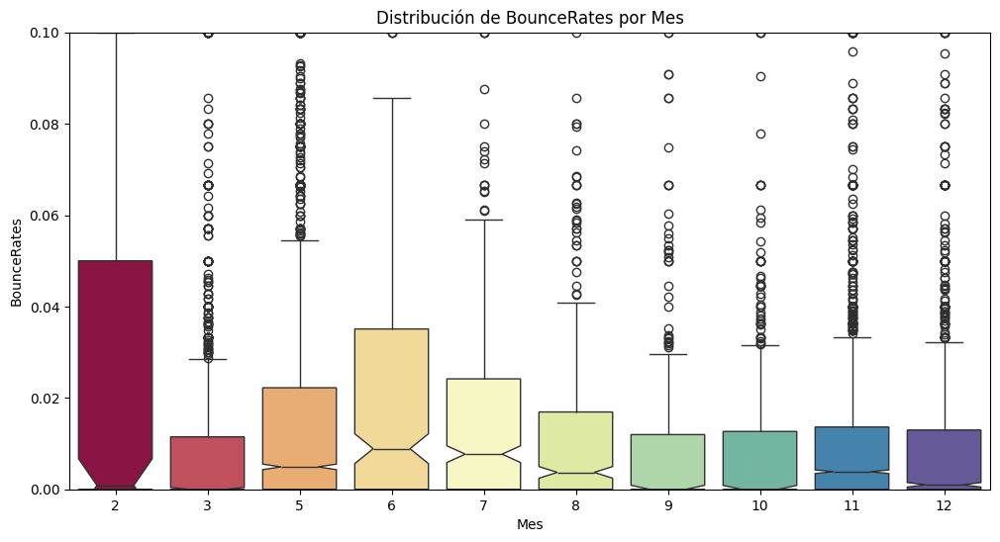

In [56]:
plt.figure(figsize=(12,6))
sns.boxplot(data=h5, x="Month", y="BounceRates", palette="Spectral",hue="Month", legend=False,notch=True)
plt.title("Distribución de BounceRates por Mes")
plt.xlabel("Mes")
plt.ylabel("BounceRates")
plt.ylim(0,0.1)
plt.show()

Los meses en general tienen una mediana similar, no hay un mes que predomine mayormente sobre otros.

Hay meses con mayor y menor variacion, por ejemplo el mes 2 o 6 parecieran ser los que mas varian en el valor de BounceRate.

Los meses 3,9,10,11 y 12 tienen distribuciones muy similares.

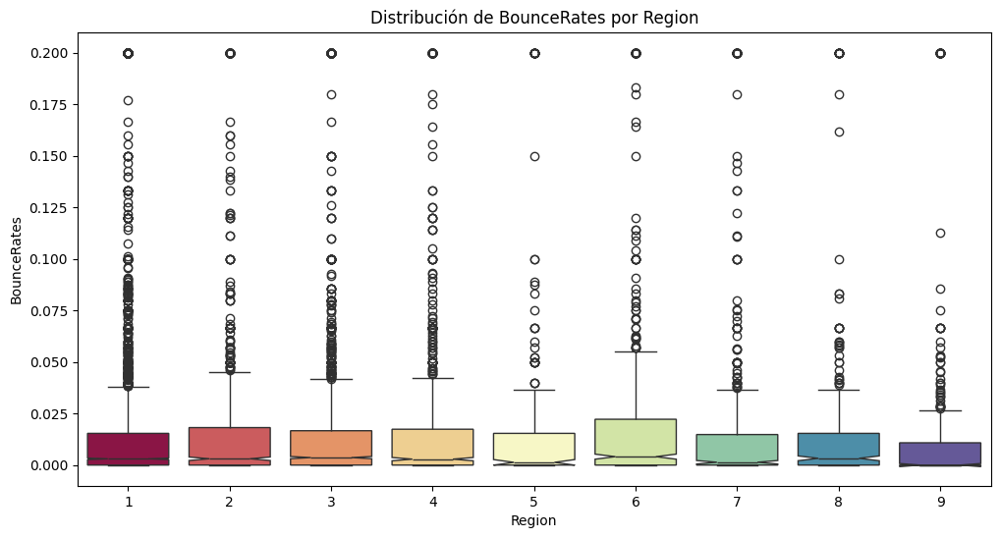

In [46]:
#Boxplot por region
plt.figure(figsize=(12,6))
sns.boxplot(data=h5, x="Region", y="BounceRates", palette="Spectral",hue="Region",legend=False,notch=True)
plt.title("Distribución de BounceRates por Region")
plt.xlabel("Region")
plt.ylabel("BounceRates")
plt.show()

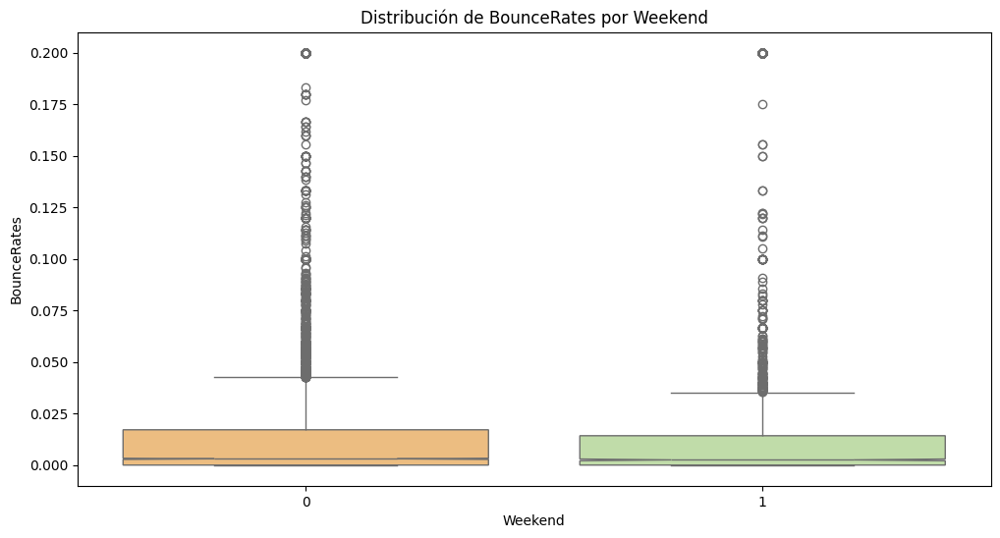

In [47]:
#Boxplot por weekend
plt.figure(figsize=(12,6))
sns.boxplot(data=h5, x="Weekend", y="BounceRates", palette="Spectral",hue="Weekend",legend=False,notch=True)
plt.title("Distribución de BounceRates por Weekend")
plt.xlabel("Weekend")
plt.ylabel("BounceRates")
plt.show()

Hagamos un zoom sobre las cajas para ver mejor la distribucion

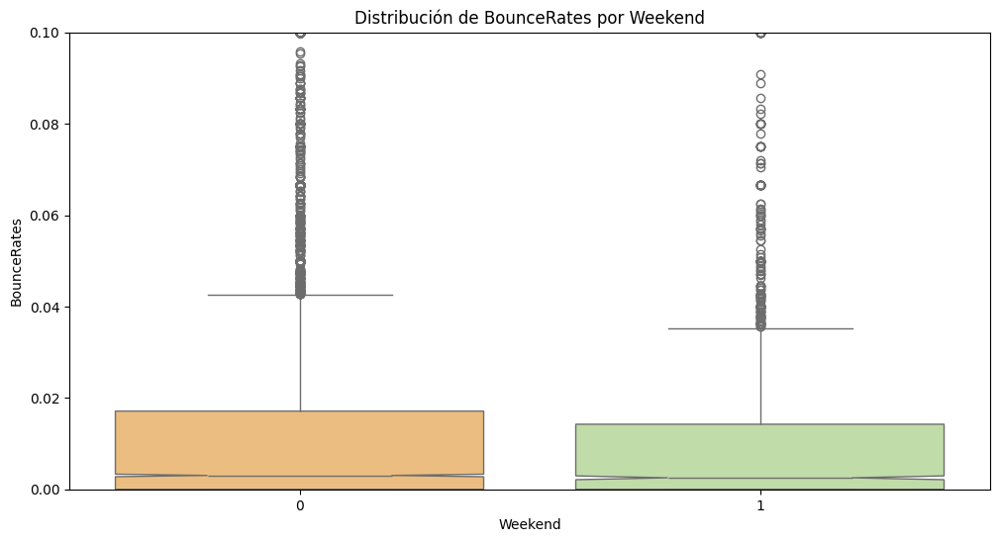

In [48]:
plt.figure(figsize=(12,6))
sns.boxplot(data=h5, x="Weekend", y="BounceRates", palette="Spectral",hue="Weekend",legend=False,notch=True)
plt.title("Distribución de BounceRates por Weekend")
plt.xlabel("Weekend")
plt.ylabel("BounceRates")
plt.ylim(0,0.1)
plt.show()

## Test de normalidad

In [51]:
# --- 1. Test de Normalidad por Month ---
print("--- 1. Tests de Normalidad para 'BounceRate' por Month ---")
# Usamos sorted() para que los meses salgan en orden
unique_months = sorted(h5['Month'].unique())

for month in unique_months:
    # Filtramos los datos para este mes
    subgrupo = h5[h5['Month'] == month]['BounceRates']

    # Shapiro-Wilk falla si hay muy pocas muestras (N <= 3)
    if len(subgrupo) > 3:
        stat, p_valor = stats.shapiro(subgrupo)
        print(f"  Mes {month} (N={len(subgrupo)}): p-valor = {p_valor:.4f}")
    else:
        print(f"  Mes {month} (N={len(subgrupo)}): No se puede testear (N <= 3).")

# --- 2. Test de Normalidad por Region ---
print("\n--- 2. Tests de Normalidad para 'BounceRate' por Region ---")
unique_regions = sorted(h4['Region'].unique())

for region in unique_regions:
    # Filtramos los datos para esta región
    subgrupo = h5[h5['Region'] == region]['BounceRates']

    if len(subgrupo) > 3:
        stat, p_valor = stats.shapiro(subgrupo)
        print(f"  Región {region} (N={len(subgrupo)}): p-valor = {p_valor:.4f}")
    else:
        print(f"  Región {region} (N={len(subgrupo)}): No se puede testear (N <= 3).")

# --- 3. Test de Normalidad por Weekend ---
print("\n--- 3. Tests de Normalidad para 'BounceRate' por Weekend ---")
# 'Weekend' es booleano (True/False)
unique_weekends = sorted(h5['Weekend'].unique())

for weekend in unique_weekends:
    # Filtramos los datos
    subgrupo = h5[h5['Weekend'] == weekend]['BounceRates']

    if len(subgrupo) > 3:
        # Etiqueta más clara para True/False
        label = "Sí (Fin de semana)" if weekend else "No (Día de semana)"
        stat, p_valor = stats.shapiro(subgrupo)
        print(f"  Weekend {label} (N={len(subgrupo)}): p-valor = {p_valor:.4f}")
    else:
        print(f"  Weekend {weekend} (N={len(subgrupo)}): No se puede testear (N <= 3).")

--- 1. Tests de Normalidad para 'BounceRate' por Month ---
  Mes 2 (N=181): p-valor = 0.0000
  Mes 3 (N=1860): p-valor = 0.0000
  Mes 5 (N=3329): p-valor = 0.0000
  Mes 6 (N=285): p-valor = 0.0000
  Mes 7 (N=432): p-valor = 0.0000
  Mes 8 (N=433): p-valor = 0.0000
  Mes 9 (N=448): p-valor = 0.0000
  Mes 10 (N=549): p-valor = 0.0000
  Mes 11 (N=2982): p-valor = 0.0000
  Mes 12 (N=1706): p-valor = 0.0000

--- 2. Tests de Normalidad para 'BounceRate' por Region ---
  Región 1 (N=4714): p-valor = 0.0000
  Región 2 (N=1128): p-valor = 0.0000
  Región 3 (N=2379): p-valor = 0.0000
  Región 4 (N=1171): p-valor = 0.0000
  Región 5 (N=318): p-valor = 0.0000
  Región 6 (N=801): p-valor = 0.0000
  Región 7 (N=758): p-valor = 0.0000
  Región 8 (N=431): p-valor = 0.0000
  Región 9 (N=505): p-valor = 0.0000

--- 3. Tests de Normalidad para 'BounceRate' por Weekend ---
  Weekend No (Día de semana) (N=9346): p-valor = 0.0000
  Weekend Sí (Fin de semana) (N=2859): p-valor = 0.0000


/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 9346.
  res = hypotest_fun_out(*samples, **kwds)


Dado que el p-valor (0.0000) es significativamente menor que el nivel de significancia ($\alpha = 0.05$), se rechaza la hipótesis nula de normalidad en todos los casos.

Esto confirma que la distribución de BounceRate es no-normal (no paramétrica) en todas las categorías.

## Test de hipotesis

Como Month y Region tienen más de 2 grupos, usaremos Kruskal-Wallis. Como Weekend tiene solo 2 grupos (Sí/No), usaremos el Test U de Mann-Whitney, que es la prueba correcta para este caso.

In [54]:
alpha = 0.05 # Nivel de significancia

# --- 1. Test de Kruskal-Wallis: BounceRate por Month ---
print("--- 1. Kruskal-Wallis: BounceRate por Month ---")
# Crear una lista de arrays, uno por cada mes
grupos_month = [
    h5[h5['Month'] == month]['BounceRates']
    for month in sorted(h5['Month'].unique())
]

# Correr el test
stat_month, p_valor_month = stats.kruskal(*grupos_month)

print(f"Estadístico H = {stat_month:.4f}")
print(f"P-Valor = {p_valor_month:.4f}")

if p_valor_month < alpha:
    print(f"Conclusión: Significativo (p < {alpha}). El 'Month' SÍ influye en la mediana de 'BounceRate'.")
else:
    print(f"Conclusión: No Significativo (p >= {alpha}). No hay evidencia de que 'Month' influya en 'BounceRate'.")

# --- 2. Test de Kruskal-Wallis: BounceRate por Region ---
print("\n--- 2. Kruskal-Wallis: BounceRate por Region ---")

# Crear una lista de arrays, uno por cada región
grupos_region = [
    h5[h5['Region'] == region]['BounceRates']
    for region in sorted(h5['Region'].unique())
]

# Correr el test
stat_region, p_valor_region = stats.kruskal(*grupos_region)

print(f"Estadístico H = {stat_region:.4f}")
print(f"P-Valor = {p_valor_region:.4f}")

if p_valor_region < alpha:
    print(f"Conclusión: Significativo (p < {alpha}). La 'Region' SÍ influye en la mediana de 'BounceRate'.")
else:
    print(f"Conclusión: No Significativo (p >= {alpha}). No hay evidencia de que 'Region' influya en 'BounceRate'.")

# --- 3. Test U de Mann-Whitney: BounceRate por Weekend ---
# (Este es el test correcto para 2 grupos no paramétricos)
print("\n--- 3. Mann-Whitney U: BounceRate por Weekend ---")

# Separar los dos grupos
grupo_finde = h5[h5['Weekend'] == True]['BounceRates']
grupo_semana = h5[h5['Weekend'] == False]['BounceRates']

# Correr el test
stat_weekend, p_valor_weekend = stats.mannwhitneyu(grupo_finde, grupo_semana, alternative='two-sided')

print(f"Estadístico U = {stat_weekend:.4f}")
print(f"P-Valor = {p_valor_weekend:.4f}")

if p_valor_weekend < alpha:
    print(f"Conclusión: Significativo (p < {alpha}). Ser 'Weekend' SÍ influye en la mediana de 'BounceRate'.")
else:
    print(f"Conclusión: No Significativo (p >= {alpha}). No hay evidencia de que 'Weekend' influya en 'BounceRate'.")

--- 1. Kruskal-Wallis: BounceRate por Month ---
Estadístico H = 228.2214
P-Valor = 0.0000
Conclusión: Significativo (p < 0.05). El 'Month' SÍ influye en la mediana de 'BounceRate'.

--- 2. Kruskal-Wallis: BounceRate por Region ---
Estadístico H = 42.6496
P-Valor = 0.0000
Conclusión: Significativo (p < 0.05). La 'Region' SÍ influye en la mediana de 'BounceRate'.

--- 3. Mann-Whitney U: BounceRate por Weekend ---
Estadístico U = 12910232.5000
P-Valor = 0.0042
Conclusión: Significativo (p < 0.05). Ser 'Weekend' SÍ influye en la mediana de 'BounceRate'.


# Hipotesis 6: Segun el Browser, tipo de trafico y Operating System varia significativamente la tasa de abandono(Exit Rate)

In [ ]:
h6 = clean_dataset.copy()

## Visualizacion

In [ ]:
browser_p= {
    1: '#3498DB',  # Azul brillante
    2: '#5DADE2',  # Azul cielo
    3: '#85C1E9',  # Azul claro
    4: '#27AE60',  # Verde esmeralda
    5: '#58D68D',  # Verde menta
    6: '#82E0AA',  # Verde pastel
    7: '#E74C3C',  # Rojo coral
    8: '#EB984E',  # Naranja melón
    9: '#F5B041',  # Amarillo dorado
    10: '#9B59B6', # Púrpura uva
    11: '#BB8FCE', # Lila suave
    12: '#D7BDE2', # Lila pastel
    13: '#16A085'  # Verde turquesa
}
os_p= {
    1: '#3498DB',  # Azul cielo
    2: '#9B59B6',  # Púrpura lavanda
    3: '#E67E22',  # Naranja suave
    4: '#E74C3C',  # Rojo coral claro
    5: '#1ABC9C',  # Verde turquesa
    6: '#D35400',  # Naranja oscuro
    7: '#2ECC71',  # Verde esmeralda
    8: '#F1C40F',  # Amarillo dorado
    9: '#34495E',  # Azul grafito
    10: '#95A5A6'  # Gris plata
}
traffic_p={
    1: '#3498DB', # Azul brillante
    2: '#5DADE2', # Azul cielo
    3: '#85C1E9', # Azul claro
    4: '#27AE60', # Verde esmeralda
    5: '#58D68D', # Verde menta
    6: '#82E0AA', # Verde pastel
    7: '#E74C3C', # Rojo coral
    8: '#EB984E', # Naranja melón
    9: '#F5B041', # Amarillo dorado
    10: '#9B59B6', # Púrpura uva
    11: '#BB8FCE', # Lila suave
    12: '#D7BDE2', # Lila pastel
    13: '#34495E', # Gris asfalto
    14: '#7F8C8D', # Gris medio
    15: '#BDC3C7', # Gris plata
    16: '#E91E63', # Rosa fucsia
    17: '#F06292', # Rosa claro
    18: '#F8BBD0', # Rosa pastel
    19: '#795548', # Marrón café
    20: '#A1887F', # Marrón claro (tan)
    21: '#D7CCC8' # Beige
}

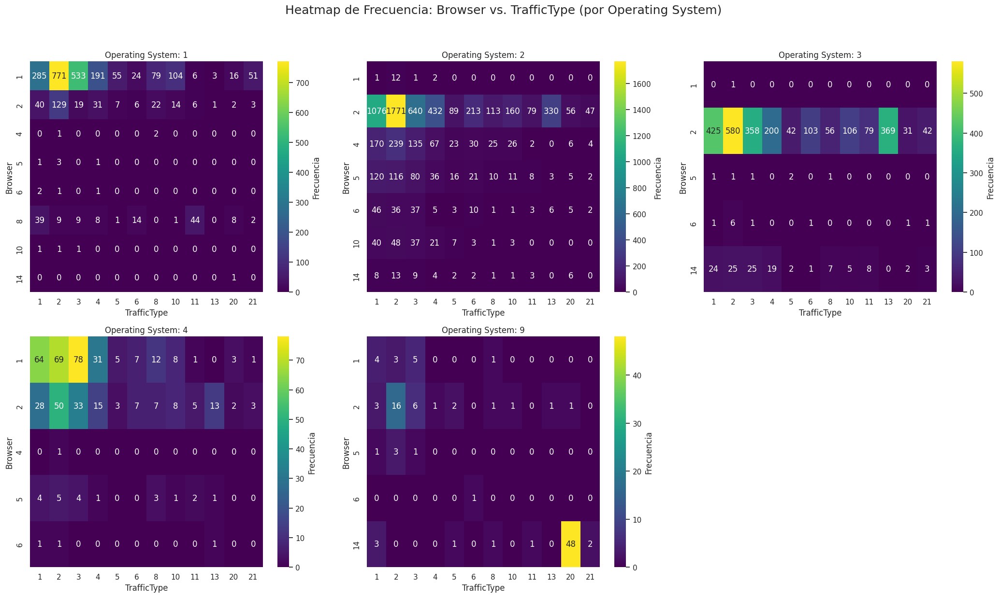

In [ ]:
# --- 1. Obtener las categorías de OperatingSystems ---
# Usamos sorted() para que aparezcan en orden (ej. 1, 2, 3...)
os_categories = sorted(h6['OperatingSystems'].unique())
num_os = len(os_categories)

# --- 2. Configurar la grilla de subplots ---
# Calculamos cuántas filas necesitamos si queremos 4 heatmaps por fila
ncols = 3
nrows = 2

fig, axes = plt.subplots(nrows=nrows,
                         ncols=ncols,
                         figsize=(ncols * 7, nrows * 6), # Damos más tamaño a cada heatmap
                         squeeze=False) # 'squeeze=False' asegura que 'axes' sea siempre 2D

# Aplanamos el array de 'axes' para iterar fácilmente
axes_flat = axes.flatten()

# --- 3. Iterar y crear un heatmap para cada OS ---
for i, os_val in enumerate(os_categories):
    ax = axes_flat[i] # Seleccionamos el subplot actual

    # Filtramos los datos solo para este OperatingSystem
    os_data = h6[h6['OperatingSystems'] == os_val]

    # Creamos la tabla de frecuencia 2D (crosstab)
    contingency_table = pd.crosstab(
        os_data['Browser'],
        os_data['TrafficType']
    )

    # Dibujamos el heatmap en su 'ax' correspondiente
    sns.heatmap(
        contingency_table,
        annot=True,     # Mostrar números
        fmt='d',        # Formato de número entero
        cmap="viridis", # Paleta de color
        ax=ax,          # Especificar en qué subplot dibujar
        cbar=True,      # Mostrar la barra de color
        cbar_kws={'label': 'Frecuencia'} # Etiqueta de la barra
    )
    ax.set_title(f'Operating System: {os_val}')
    ax.set_xlabel('TrafficType')
    ax.set_ylabel('Browser')

# --- 4. Ocultar los subplots vacíos ---
# Si tienes 9 OS, (nrows=3, ncols=4) -> 12 plots. Ocultamos los 3 últimos.
for j in range(i + 1, len(axes_flat)):
    axes_flat[j].axis('off')

# Título general de la figura
fig.suptitle('Heatmap de Frecuencia: Browser vs. TrafficType (por Operating System)',
             fontsize=18, y=1.03)

plt.tight_layout()
plt.show()

El heatmap se generó para visualizar la distribución de la frecuencia de las sesiones de usuario en la intersección de las variables categóricas Browser y TrafficType. El color, que va de violeta a amarillo, representa la frecuencia de menor a mayor.

El análisis visual revela inmediatamente que el tráfico no está distribuido de manera uniforme; al contrario, está altamente concentrado en unas pocas combinaciones específicas. El punto más "caliente" (amarillo brillante) del gráfico es la intersección de Browser 2 y TrafficType 2, que con 3,192 sesiones representa, por un amplio margen, la combinación más común de adquisición y tecnología de usuario.

A este pico principal le siguen otras tres concentraciones significativas: Browser 2 con TrafficType 1 (1,391 sesiones), Browser 2 con TrafficType 3 (1,303) y Browser 1 con TrafficType 1 (1,017). Fuera de estas cuatro combinaciones dominantes, que involucran solo a los Browsers 1 y 2 y los TrafficTypes 1, 2 y 3, la matriz es extremadamente dispersa. La gran mayoría de las celdas son de color violeta oscuro, indicando frecuencias muy bajas (a menudo de un solo dígito). Esto confirma que el resto de las categorías de Browser y TrafficType representan una "larga cola" de comportamiento del usuario, validando la decisión de agruparlas en la limpieza de datos.

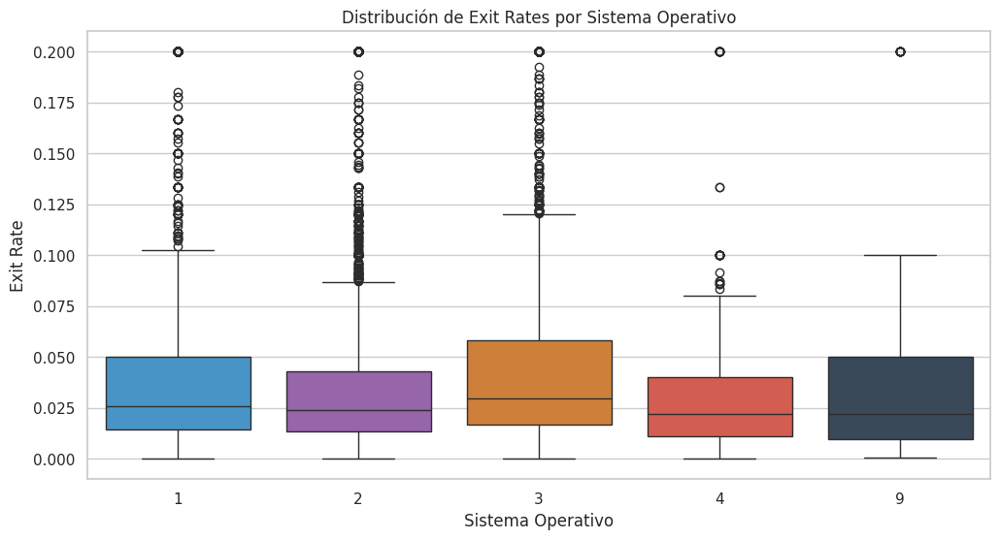

In [ ]:
# Boxplot entre sistemas operativos y exit rate
plt.figure(figsize=(12,6))
sns.boxplot(data=h6, x="OperatingSystems", y="ExitRates",hue="OperatingSystems", palette=[os_p.get(x, '#333333') for x in sorted(h6['OperatingSystems'].unique())],legend=False)
plt.title("Distribución de Exit Rates por Sistema Operativo")
plt.xlabel("Sistema Operativo")
plt.ylabel("Exit Rate")
plt.show()


El boxplot que compara la ExitRate (tasa de abandono) por OperatingSystem (Sistema Operativo) muestra que, si bien la mayoría de las sesiones en todos los sistemas tienen tasas de abandono muy bajas (concentradas por debajo del 0.05), existen diferencias claras en sus distribuciones.

Específicamente, los Sistemas Operativos 3 y 4 presentan una dispersión notablemente mayor (cajas más altas) y valores de abandono más elevados en sus cuartiles superiores. Esto contrasta con los Sistemas 1, 2 y 9, que son mucho más compactos y consistentes.

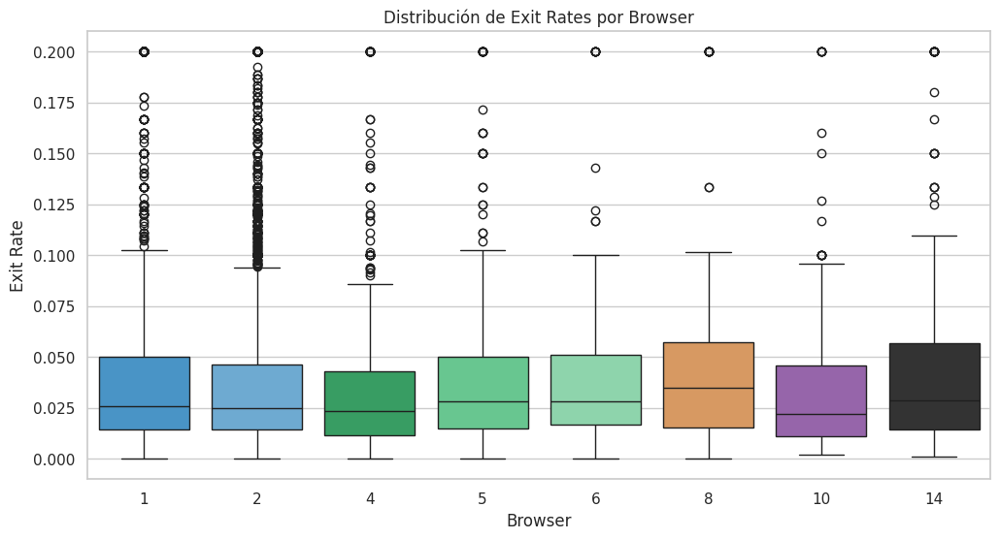

In [ ]:
# Boxplot de exit rate por browser
plt.figure(figsize=(12,6))
sns.boxplot(data=h6, x="Browser", y="ExitRates", palette=[browser_p.get(x, '#333333') for x in sorted(h6['Browser'].unique())],hue="Browser",legend=False)
plt.title("Distribución de Exit Rates por Browser")
plt.xlabel("Browser")
plt.ylabel("Exit Rate")
plt.show()

En este gráfico, las medianas se mantienen bastante estables, aunque algunos navegadores (por ejemplo, el 8 y el 14) muestran una ligera elevación en la tasa de salida, indicando que pueden ser problematicos, algo hay en esos navegadores que hace que la gente salga de la pagina sin realizar una accion importante. También se observa presencia de outliers en todos los grupos, lo cual indica comportamiento heterogéneo de usuarios dentro de un mismo navegador.

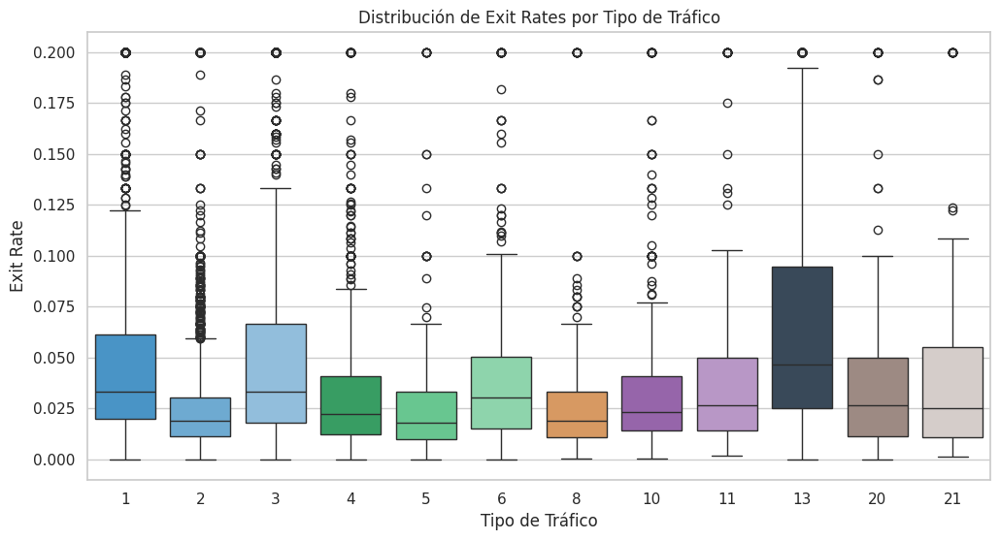

In [ ]:
#Boxplot de exit rate por traffic type
plt.figure(figsize=(12,6))
sns.boxplot(data=h6, x="TrafficType", y="ExitRates", palette=[traffic_p.get(x, '#333333') for x in sorted(h6['TrafficType'].unique())],hue="TrafficType",legend=False)
plt.title("Distribución de Exit Rates por Tipo de Tráfico")
plt.xlabel("Tipo de Tráfico")
plt.ylabel("Exit Rate")
plt.show()

Acá sí se observan diferencias más marcadas. Algunos tipos de tráfico (por ejemplo, el 3, 13 y 20) presentan medianas claramente más altas y mayor variabilidad. Esto indica que la fuente o canal de llegada al sitio sí influye de forma notoria en la tasa de abandono, probablemente porque algunos usuarios provienen de campañas menos relevantes o de enlaces externos no alineados al contenido.

## Test de normalidad

In [ ]:
print("--- 1. Tests de Normalidad para 'ExitRate' por Browser ---")
unique_browsers = sorted(h6['Browser'].unique())

for browser in unique_browsers:
    # Filtramos los datos para este browser
    subgrupo = h6[h6['Browser'] == browser]['ExitRates']

    # Shapiro-Wilk falla si hay muy pocas muestras (N <= 3)
    if len(subgrupo) > 3:
        stat, p_valor = stats.shapiro(subgrupo)
        print(f"  Browser {browser} (N={len(subgrupo)}): p-valor = {p_valor:.4f}")
    else:
        print(f"  Browser {browser} (N={len(subgrupo)}): No se puede testear (muy pocas muestras).")

# --- 2. Test de Normalidad por OperatingSystem ---
print("\n--- 2. Tests de Normalidad para 'ExitRate' por OperatingSystem ---")
unique_os = sorted(h6['OperatingSystems'].unique())

for os in unique_os:
    # Filtramos los datos para este OS
    subgrupo = h6[h6['OperatingSystems'] == os]['ExitRates']

    if len(subgrupo) > 3:
        stat, p_valor = stats.shapiro(subgrupo)
        print(f"  OS {os} (N={len(subgrupo)}): p-valor = {p_valor:.4f}")
    else:
        print(f"  OS {os} (N={len(subgrupo)}): No se puede testear.")

# --- 3. Test de Normalidad por TrafficType ---
print("\n--- 3. Tests de Normalidad para 'ExitRate' por TrafficType ---")
unique_traffic = sorted(h6['TrafficType'].unique())

for traffic in unique_traffic:
    # Filtramos los datos para este Tipo de Tráfico
    subgrupo = h6[h6['TrafficType'] == traffic]['ExitRates']

    if len(subgrupo) > 3:
        stat, p_valor = stats.shapiro(subgrupo)
        print(f"  TrafficType {traffic} (N={len(subgrupo)}): p-valor = {p_valor:.4f}")
    else:
        print(f"  TrafficType {traffic} (N={len(subgrupo)}): No se puede testear.")

--- 1. Tests de Normalidad para 'ExitRate' por Browser ---
  Browser 1 (N=2427): p-valor = 0.0000
  Browser 2 (N=7883): p-valor = 0.0000
  Browser 4 (N=731): p-valor = 0.0000
  Browser 5 (N=465): p-valor = 0.0000
  Browser 6 (N=174): p-valor = 0.0000
  Browser 8 (N=135): p-valor = 0.0000
  Browser 10 (N=163): p-valor = 0.0000
  Browser 14 (N=227): p-valor = 0.0000

--- 2. Tests de Normalidad para 'ExitRate' por OperatingSystem ---
  OS 1 (N=2549): p-valor = 0.0000
  OS 2 (N=6541): p-valor = 0.0000
  OS 3 (N=2530): p-valor = 0.0000
  OS 4 (N=478): p-valor = 0.0000
  OS 9 (N=107): p-valor = 0.0000

--- 3. Tests de Normalidad para 'ExitRate' por TrafficType ---
  TrafficType 1 (N=2388): p-valor = 0.0000
  TrafficType 2 (N=3911): p-valor = 0.0000
  TrafficType 3 (N=2013): p-valor = 0.0000
  TrafficType 4 (N=1066): p-valor = 0.0000
  TrafficType 5 (N=260): p-valor = 0.0000
  TrafficType 6 (N=443): p-valor = 0.0000
  TrafficType 8 (N=343): p-valor = 0.0000
  TrafficType 10 (N=450): p-valor =

/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 7883.
  res = hypotest_fun_out(*samples, **kwds)
/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 6541.
  res = hypotest_fun_out(*samples, **kwds)


Conclusión de los Tests de Normalidad (H6)

Como paso previo para validar la Hipótesis 6, se evaluó la normalidad de la variable ExitRate dentro de cada subgrupo categórico (Browser, OperatingSystem y TrafficType) utilizando el test de Shapiro-Wilk.

Los resultados son concluyentes:

En todos los grupos analizados (para las tres variables categóricas) donde el test pudo ser ejecutado, el p-valor resultante fue 0.0000.Dado que el p-valor (0.0000) es significativamente menor que el nivel de significancia estándar ($\alpha = 0.05$), se rechaza la hipótesis nula de normalidad en todos los casos.

Implicancia Metodológica

La confirmación de que los datos de ExitRate no siguen una distribución normal dentro de los grupos es metodológicamente crítica. Descarta el uso de tests paramétricos (como ANOVA) para comparar las medias, ya que estos tests asumen la normalidad de los datos.Por lo tanto, se valida el plan de análisis propuesto: la forma correcta de proceder es utilizar la alternativa no paramétrica, el Test de Kruskal-Wallis, para determinar si existen diferencias estadísticamente significativas en las medianas de ExitRate entre los grupos.

## Test de hipotesis

La falta de normalidad es razón más que suficiente para mover todo el análisis al dominio no paramétrico, y el test para comparar +2 grupos allí es el Test de Kruskal-Wallis.

In [ ]:
alpha = 0.05 # Nivel de significancia

# --- 1. Test para ExitRate por OperatingSystem ---
print("--- 1. Kruskal-Wallis: ExitRate por OperatingSystem ---")

# Crear una lista de los 'ExitRate' para cada grupo de 'OperatingSystems'
grupos_os = [
    h6[h6['OperatingSystems'] == os]['ExitRates']
    for os in sorted(h6['OperatingSystems'].unique())
]

# Correr el test
stat_os, p_valor_os = stats.kruskal(*grupos_os)

print(f"Estadístico H = {stat_os:.4f}")
print(f"P-Valor = {p_valor_os:.4f}")

if p_valor_os < alpha:
    print(f"Conclusión: Significativo (p < {alpha}). El 'OperatingSystem' SÍ influye en la mediana de 'ExitRate'.")
else:
    print(f"Conclusión: No Significativo (p >= {alpha}). No hay evidencia de que el 'OperatingSystem' influya en 'ExitRate'.")

# --- 2. Test para ExitRate por Browser ---
print("\n--- 2. Kruskal-Wallis: ExitRate por Browser ---")

# Crear una lista de los 'ExitRate' para cada grupo de 'Browser'
grupos_browser = [
    h6[h6['Browser'] == browser]['ExitRates']
    for browser in sorted(h6['Browser'].unique())
]

# Correr el test
stat_browser, p_valor_browser = stats.kruskal(*grupos_browser)

print(f"Estadístico H = {stat_browser:.4f}")
print(f"P-Valor = {p_valor_browser:.4f}")

if p_valor_browser < alpha:
    print(f"Conclusión: Significativo (p < {alpha}). El 'Browser' SÍ influye en la mediana de 'ExitRate'.")
else:
    print(f"Conclusión: No Significativo (p >= {alpha}). No hay evidencia de que el 'Browser' influya en 'ExitRate'.")

# --- 3. Test para ExitRate por TrafficType ---
print("\n--- 3. Kruskal-Wallis: ExitRate por TrafficType ---")

# Crear una lista de los 'ExitRate' para cada grupo de 'TrafficType'
grupos_traffic = [
    h6[h6['TrafficType'] == traffic]['ExitRates']
    for traffic in sorted(h6['TrafficType'].unique())
]

# Correr el test
stat_traffic, p_valor_traffic = stats.kruskal(*grupos_traffic)

print(f"Estadístico H = {stat_traffic:.4f}")
print(f"P-Valor = {p_valor_traffic:.4f}")

if p_valor_traffic < alpha:
    print(f"Conclusión: Significativo (p < {alpha}). El 'TrafficType' SÍ influye en la mediana de 'ExitRate'.")
else:
    print(f"Conclusión: No Significativo (p >= {alpha}). No hay evidencia de que el 'TrafficType' influya en 'ExitRate'.")

--- 1. Kruskal-Wallis: ExitRate por OperatingSystem ---
Estadístico H = 136.2139
P-Valor = 0.0000
Conclusión: Significativo (p < 0.05). El 'OperatingSystem' SÍ influye en la mediana de 'ExitRate'.

--- 2. Kruskal-Wallis: ExitRate por Browser ---
Estadístico H = 27.5454
P-Valor = 0.0003
Conclusión: Significativo (p < 0.05). El 'Browser' SÍ influye en la mediana de 'ExitRate'.

--- 3. Kruskal-Wallis: ExitRate por TrafficType ---
Estadístico H = 1351.4775
P-Valor = 0.0000
Conclusión: Significativo (p < 0.05). El 'TrafficType' SÍ influye en la mediana de 'ExitRate'.


Se realizaron tres tests de Kruskal-Wallis independientes, uno para cada variable categórica contra la ExitRate.

Los resultados fueron los siguientes:

ExitRate vs. OperatingSystem:

Estadístico H = 136.2139

p-valor = 0.0000

ExitRate vs. Browser:

Estadístico H = 27.5454

p-valor = 0.0003

ExitRate vs. TrafficType:

Estadístico H = 1351.4775

p-valor = 0.0000

Veredicto Final

En los tres casos, el p-valor obtenido es significativamente menor que el nivel de significancia estándar ($\alpha = 0.05$). En consecuencia, se rechaza la hipótesis nula para cada una de las tres pruebas.

Se valida la Hipótesis 6. Existe evidencia estadística robusta para afirmar que la mediana de la tasa de abandono (ExitRate) varía significativamente dependiendo del sistema operativo (OperatingSystem), el navegador (Browser) y el tipo de tráfico (TrafficType) del usuario.

Aunque las tres variables son significativas, el estadístico H (que mide la magnitud de la diferencia entre grupos) sugiere que el TrafficType (H=1351.5) tiene la asociación más fuerte con la tasa de abandono, seguido por el OperatingSystem (H=136.2) y, en menor medida, el Browser (H=27.5).